In [ ]:
#!pip install darts

In [ ]:
!pip install pyaf

     |████████████████████████████████| 122kB 30.4MB/s 


In [ ]:
!pip install pycaret

In [ ]:
'''
https://github.com/antoinecarme/pyaf/blob/master/docs/PyAF_Hierarchical_FrenchWineExportation.ipynb
https://github.com/franckjay/HierarchicalFordGoBike
'''

'\nhttps://github.com/antoinecarme/pyaf/blob/master/docs/PyAF_Hierarchical_FrenchWineExportation.ipynb\nhttps://github.com/franckjay/HierarchicalFordGoBike\n'

In [ ]:
import os
import pandas as pd
import numpy as np
import datetime

import itertools

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.float_format', lambda x: '{:.15f}'.format(x))

In [ ]:
df_shipment = pd.read_csv('result_shipment_only.csv')
#df2 = pd.read_csv('result_shipment_only_2.csv')
#df3 = pd.read_csv('result_shipment_only_3.csv')
#df = pd.concat([df1, df2, df3])
#df_shipment = df_shipment.assign(generic_cust_item_id=(df_shipment['UCH_LEVEL_G'].astype(str) + '_' + df_shipment['BASECODE'].astype(str)).astype('category').cat.codes)
df_shipment.columns = [c.lower() for c in df_shipment.columns]
#Converting fscl_wk_end_dt column to datetime format
df_shipment['fscl_wk_end_dt'] = pd.to_datetime(df_shipment['fscl_wk_end_dt'])
#df_shipment.set_index('fscl_wk_end_dt', inplace=True)
#df_shipment

df_cust_po = pd.read_csv('result_cust_po.csv')
#df2 = pd.read_csv('result_shipment_only_2.csv')
#df3 = pd.read_csv('result_shipment_only_3.csv')
#df = pd.concat([df1, df2, df3])
#df_cust_po = df_cust_po.assign(generic_cust_item_id=(df_cust_po['UCH_LEVEL_G'].astype(str) + '_' + df_cust_po['BASECODE'].astype(str)).astype('category').cat.codes)
df_cust_po.columns = [c.lower() for c in df_cust_po.columns]
#Converting fscl_wk_end_dt column to datetime format
df_cust_po['fscl_wk_end_dt'] = pd.to_datetime(df_cust_po['fscl_wk_end_dt'])
#df_cust_po.set_index('fscl_wk_end_dt', inplace=True)
#df_cust_po

df_po_vs_shipment = pd.merge(df_shipment[['uch_level_g','basecode','fscl_wk_end_dt','sales_document','material','dlv_units']], df_cust_po[['uch_level_g','basecode','fscl_wk_end_dt','sales_document','material','total_units_ordered']], on=['uch_level_g','basecode','fscl_wk_end_dt','sales_document','material'], how="inner")
df_po_vs_shipment = df_po_vs_shipment.assign(generic_cust_item_id=(df_po_vs_shipment['uch_level_g'].astype(str) + '_' + df_po_vs_shipment['basecode'].astype(str)).astype('category').cat.codes)

df_po_vs_shipment.set_index(['fscl_wk_end_dt'], inplace=True)
df_po_vs_shipment.total_units_ordered = df_po_vs_shipment.total_units_ordered.astype(int)
df_po_vs_shipment = df_po_vs_shipment[['uch_level_g','basecode','generic_cust_item_id', 'dlv_units']]
df_po_vs_shipment.to_csv('df_po_vs_shipment.csv')
#df_po_vs_shipment

df_po_vs_shipment_agg=df_po_vs_shipment.reset_index().groupby(['uch_level_g','basecode','generic_cust_item_id', 'fscl_wk_end_dt'])[["dlv_units"]].agg(["sum"]).reset_index()
df_po_vs_shipment_agg.columns = ['uch_level_g','basecode','generic_cust_item_id', 'fscl_wk_end_dt','dlv_units']

df_po_vs_shipment_agg_stat=df_po_vs_shipment_agg.groupby(['uch_level_g','basecode','generic_cust_item_id'])[["dlv_units"]].agg(["count","sum","mean","std"])
df_po_vs_shipment_agg_stat.columns = ['dlv_units_count','dlv_units_sum','dlv_units_avg','dlv_units_std']
df_po_vs_shipment_agg_stat['dlv_units_cv_times_cnt'] = (df_po_vs_shipment_agg_stat.dlv_units_std / df_po_vs_shipment_agg_stat.dlv_units_avg) * df_po_vs_shipment_agg_stat.dlv_units_count
df_po_vs_shipment_agg_stat.reset_index(inplace=True)

#df_po_vs_shipment_agg_stat = df_po_vs_shipment_agg_stat.assign(generic_cust_item_id=(df_po_vs_shipment_agg_stat['uch_level_g'].astype(str) + '_' + df_po_vs_shipment_agg_stat['basecode'].astype(str)).astype('category').cat.codes)
df_po_vs_shipment_agg_stat = df_po_vs_shipment_agg_stat.assign(generic_cust_id=(df_po_vs_shipment_agg_stat['uch_level_g'].astype(str)).astype('category').cat.codes)
df_po_vs_shipment_agg_stat = df_po_vs_shipment_agg_stat.assign(generic_item_id=(df_po_vs_shipment_agg_stat['basecode'].astype(str)).astype('category').cat.codes)
df_po_vs_shipment_agg_stat = df_po_vs_shipment_agg_stat.dropna()
#df_po_vs_shipment_agg_stat.head()

df_po_vs_shipment_agg_stat_orig = df_po_vs_shipment_agg_stat.copy()
df_po_vs_shipment_agg_stat = df_po_vs_shipment_agg_stat[df_po_vs_shipment_agg_stat.dlv_units_count > 70]
df_po_vs_shipment_agg_orig_1 = df_po_vs_shipment_agg.copy()
df_po_vs_shipment_agg = pd.merge(df_po_vs_shipment_agg, df_po_vs_shipment_agg_stat, how = 'inner', on = ['uch_level_g','basecode','generic_cust_item_id'])[['uch_level_g','basecode','generic_cust_item_id','dlv_units', 'fscl_wk_end_dt']]
df_po_vs_shipment_agg.set_index('fscl_wk_end_dt', inplace=True)
df_po_vs_shipment_agg = df_po_vs_shipment_agg[['generic_cust_item_id','dlv_units']]
df_po_vs_shipment_agg.head()

,generic_cust_item_id,dlv_units
fscl_wk_end_dt,,
2017-12-02,33,100
2017-12-09,33,75
2017-12-16,33,140
2017-12-23,33,140
2017-12-30,33,100


In [ ]:
from pycaret.regression import * 
from pycaret.datasets import get_data
import itertools
from pycaret.utils import check_metric
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

unique_list = list(set(list(df_po_vs_shipment_agg.generic_cust_item_id)))
kpi_list = []
err_list = []
for i in unique_list:
    print("Processing generic_cust_item_id : " + str(i))
    try:
        new_df = df_po_vs_shipment_agg[(df_po_vs_shipment_agg.generic_cust_item_id == i)][['dlv_units']]
        if len(new_df[new_df.index <= '2019-12-28']) < 70:
            err_list.append(i)
        reg1 = setup(data = new_df, target = 'dlv_units', silent = True) 
        
        lightgbm = create_model('lightgbm', fold=10)
        tuned_lightgbm_custom = ensemble_model(lightgbm, n_estimators=50)
        
        rf = create_model('rf', fold=10)
        bagged_rf = ensemble_model(rf, n_estimators=50)
        
        dt = create_model('dt', fold=10)
        bagged_dt = ensemble_model(dt, n_estimators=50)
        
        et = create_model('et', fold=10)
        bagged_et = ensemble_model(et, n_estimators=50)
        
        dataset_train = new_df[new_df.index <= '2019-12-28']
        data_unseen = new_df[new_df.index > '2019-12-28']
        data_unseen.reset_index(inplace=True)    

        # blend individual models
        blender = blend_models(estimator_list = [tuned_lightgbm_custom, bagged_rf, bagged_dt, bagged_et])
        final_blender = finalize_model(blender)
        print(final_blender)
        evaluate_model(final_blender)
        
        unseen_predictions = predict_model(final_blender, data=data_unseen)
        unseen_predictions.to_csv("stacking_unseen_predictions_" + str(i) + ".csv", index=False)
        print("R2 : " + str(check_metric(unseen_predictions.dlv_units, unseen_predictions.Label, 'R2')))
        print("MAPE : " + str(check_metric(unseen_predictions.dlv_units, unseen_predictions.Label, 'MAPE')))
        print("MSE : " + str(mean_squared_error(unseen_predictions.Label, unseen_predictions.dlv_units)))
        print("wMAPE : " + str(np.sum(np.abs(unseen_predictions.dlv_units - unseen_predictions.Label)) / np.abs(np.sum(unseen_predictions.dlv_units))))
        print("Accuracy : " + str(1-np.sum(np.abs(unseen_predictions.dlv_units - unseen_predictions.Label)) / np.abs(np.sum(unseen_predictions.dlv_units))))
        kpi_list.append((i, check_metric(unseen_predictions.dlv_units, unseen_predictions.Label, 'R2'), check_metric(unseen_predictions.dlv_units, unseen_predictions.Label, 'MAPE'), mean_squared_error(unseen_predictions.Label, unseen_predictions.dlv_units), np.sum(np.abs(unseen_predictions.dlv_units - unseen_predictions.Label)) / np.abs(np.sum(unseen_predictions.dlv_units)), 1-np.sum(np.abs(unseen_predictions.dlv_units - unseen_predictions.Label)) / np.abs(np.sum(unseen_predictions.dlv_units)) ))
        
    except:
        err_list.append(i)
    


,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,107.946399999999997,15259.479900000000271,123.529300000000006,-0.749000000000000,0.894500000000000,1.532400000000000
1,131.548499999999990,19263.102399999999761,138.791599999999988,-0.102200000000000,0.709100000000000,0.934500000000000
2,151.063799999999986,27824.490099999999074,166.806700000000006,-0.032800000000000,1.068900000000000,1.964400000000000
3,114.701800000000006,16725.529099999999744,129.327200000000005,-0.299100000000000,0.717000000000000,0.951900000000000
4,182.166699999999992,68329.894000000000233,261.399900000000002,-0.115200000000000,0.653300000000000,0.559500000000000
5,147.710499999999996,25224.649600000000646,158.822699999999998,-6.405400000000000,0.953200000000000,1.585600000000000
6,230.421099999999996,64651.595600000000559,254.266799999999989,-0.000000000000000,1.557000000000000,4.572500000000000
7,121.877200000000002,43175.889199999997800,207.788099999999986,-0.504400000000000,0.469100000000000,0.229700000000000
8,78.862600000000000,11802.443400000000111,108.639099999999999,-0.108000000000000,0.385700000000000,0.302400000000000
9,250.000000000000000,190338.423799999989569,436.277899999999988,-0.129900000000000,0.767600000000000,0.536200000000000


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=7787, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)


In [ ]:
from pycaret.regression import * 
from pycaret.datasets import get_data
import itertools
from pycaret.utils import check_metric
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

unique_list = list(set(list(df_po_vs_shipment_agg.generic_cust_item_id)))
new_df = df_po_vs_shipment_agg[(df_po_vs_shipment_agg.generic_cust_item_id == unique_list[0])][['dlv_units']]

reg1 = setup(data = new_df, target = 'dlv_units', silent = True) 
        
lightgbm = create_model('lightgbm', fold=10)
#bagged_lightgbm = ensemble_model(lightgbm)
        
rf = create_model('rf')
#bagged_rf = ensemble_model(rf)
        
dt = create_model('dt')
#bagged_dt = ensemble_model(dt)
        
et = create_model('et')
#bagged_et = ensemble_model(et)
        
dataset_train = new_df[new_df.index <= '2019-12-28']
data_unseen = new_df[new_df.index > '2019-12-28']
data_unseen.reset_index(inplace=True)    

# blend individual models
blender = blend_models(estimator_list = [lightgbm, rf, dt, et])
final_blender = finalize_model(blender)
print(final_blender)
evaluate_model(final_blender)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,39.918500000000002,2386.993100000000140,48.856900000000003,-0.016600000000000,1.014600000000000,1.804600000000000
1,25.643500000000000,882.285399999999981,29.703299999999999,-0.225400000000000,0.772100000000000,1.080900000000000
2,29.408700000000000,1189.755799999999908,34.492800000000003,-2.497600000000000,1.150100000000000,2.545400000000000
3,45.487000000000002,3994.489599999999882,63.201999999999998,-0.695500000000000,0.665000000000000,0.397800000000000
4,26.752199999999998,1004.144099999999980,31.688199999999998,-0.200900000000000,1.207400000000000,3.187300000000000
5,39.539099999999998,1785.344800000000077,42.253300000000003,-0.089300000000000,0.747100000000000,0.905500000000000
6,13.526100000000000,369.266999999999996,19.216300000000000,-0.578100000000000,0.463200000000000,0.470600000000000
7,14.308700000000000,284.382299999999987,16.863600000000002,-0.683100000000000,0.366200000000000,0.387400000000000
8,33.204300000000003,1411.078700000000026,37.564300000000003,-0.209100000000000,1.120100000000000,2.174100000000000
9,37.547800000000002,2906.746299999999792,53.914200000000001,-0.595600000000000,0.591200000000000,0.330500000000000


IntProgress(value=0, description='Processing: ', max=4)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,18:36:13
Status,. . . . . . . . . . . . . . . . . .,Finalizing Model
Estimator,. . . . . . . . . . . . . . . . . .,Random Forest Regressor


,MAE,MSE,RMSE,R2,RMSLE,MAPE


ValueError: ignored

In [ ]:
compare_models()

IntProgress(value=0, description='Processing: ', max=89)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,18:36:47
Status,. . . . . . . . . . . . . . . . . .,Compiling Final Models
Estimator,. . . . . . . . . . . . . . . . . .,Linear Regression


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lr,Linear Regression,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.008000000000000
huber,Huber Regressor,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.009000000000000
gbr,Gradient Boosting Regressor,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.009000000000000
ada,AdaBoost Regressor,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.009000000000000
et,Extra Trees Regressor,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.010000000000000
rf,Random Forest Regressor,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.009000000000000
dt,Decision Tree Regressor,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.010000000000000
knn,K Neighbors Regressor,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.010000000000000
par,Passive Aggressive Regressor,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.009000000000000
lasso,Lasso Regression,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.010000000000000


ValueError: ignored

In [ ]:
unseen_predictions

,fscl_wk_end_dt,generic_cust_item_id,dlv_units,Label
0,2020-01-04,73,135,130.956411519647361
1,2020-01-18,73,60,130.956411519647361
2,2020-01-25,73,60,130.956411519647361
3,2020-02-01,73,165,130.956411519647361
4,2020-02-15,73,90,130.956411519647361
5,2020-02-22,73,60,130.956411519647361
6,2020-04-25,73,90,130.956411519647361
7,2020-05-02,73,375,130.956411519647361
8,2020-05-09,73,90,130.956411519647361
9,2020-05-16,73,120,130.956411519647361


In [ ]:
i

398

In [ ]:
err_list

[384,
 391,
 398,
 398,
 401,
 403,
 408,
 539,
 539,
 288,
 33,
 33,
 289,
 290,
 291,
 292,
 294,
 295,
 296,
 297,
 304,
 306,
 51,
 51,
 307,
 309,
 309,
 310,
 315,
 315,
 317,
 317,
 318,
 318,
 319,
 319,
 324,
 324,
 71,
 71,
 72,
 73,
 74,
 74,
 328,
 328,
 331,
 331,
 205,
 205,
 206,
 206,
 333,
 333,
 81,
 81,
 337,
 337,
 213,
 213,
 225,
 225,
 226,
 226,
 227,
 227,
 228,
 228,
 106,
 106,
 107,
 107,
 109,
 109,
 110,
 110,
 239,
 239,
 242,
 242,
 376,
 376]

In [ ]:
reg1 = setup(data = new_df, target = 'dlv_units', silent = True) 

best = compare_models()

,Description,Value
0,session_id,8669
1,Target,dlv_units
2,Original Data,"(77, 2)"
3,Missing Values,False
4,Numeric Features,0
5,Categorical Features,1
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(53, 1)"


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[], target='dlv_units',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strat...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluster_all', 'passthrough'),
              

IntProgress(value=0, description='Processing: ', max=89)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,14:25:49
Status,. . . . . . . . . . . . . . . . . .,Compiling Final Models
Estimator,. . . . . . . . . . . . . . . . . .,Light Gradient Boosting Machine


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.012000000000000
huber,Huber Regressor,33.047400000000003,1607.398599999999988,37.792999999999999,-0.793800000000000,0.000000000000000,0.996400000000000,0.018000000000000
lr,Linear Regression,32.781900000000000,1588.162199999999984,38.041600000000003,-0.976300000000000,0.000000000000000,1.087300000000000,0.266000000000000
lasso,Lasso Regression,32.781900000000000,1588.162199999999984,38.041600000000003,-0.976300000000000,0.000000000000000,1.087300000000000,0.014000000000000
ridge,Ridge Regression,32.781900000000000,1588.162199999999984,38.041600000000003,-0.976300000000000,0.000000000000000,1.087300000000000,0.016000000000000
en,Elastic Net,32.781900000000000,1588.162199999999984,38.041600000000003,-0.976300000000000,0.000000000000000,1.087300000000000,0.015000000000000
lar,Least Angle Regression,32.781900000000000,1588.162199999999984,38.041600000000003,-0.976300000000000,0.000000000000000,1.087300000000000,0.015000000000000
llar,Lasso Least Angle Regression,32.781900000000000,1588.162199999999984,38.041600000000003,-0.976300000000000,0.000000000000000,1.087300000000000,0.015000000000000
omp,Orthogonal Matching Pursuit,32.781900000000000,1588.162199999999984,38.041600000000003,-0.976300000000000,0.000000000000000,1.087300000000000,0.015000000000000
br,Bayesian Ridge,32.781900000000000,1588.162199999999984,38.041600000000003,-0.976300000000000,0.000000000000000,1.087300000000000,0.015000000000000


INFO:logs:Initializing Linear Regression
INFO:logs:Total runtime is 3.848473230997721e-05 minutes
INFO:logs:SubProcess create_model() called ==================================
INFO:logs:Initializing create_model()
INFO:logs:create_model(estimator=lr, fold=KFold(n_splits=10, random_state=None, shuffle=False), round=4, cross_validation=True, predict=True, fit_kwargs={}, groups=None, refit=False, verbose=False, system=False, metrics=None, display=<pycaret.internal.Display.Display object at 0x7f96aadbae10>, kwargs={})
INFO:logs:Checking exceptions
INFO:logs:Importing libraries
INFO:logs:Copying training dataset
INFO:logs:Defining folds
INFO:logs:Declaring metric variables
INFO:logs:Importing untrained model
INFO:logs:Linear Regression Imported succesfully
INFO:logs:Starting cross validation
INFO:logs:Cross validating with KFold(n_splits=10, random_state=None, shuffle=False), n_jobs=-1
INFO:logs:Calculating mean and std
INFO:logs:Creating metrics dataframe
INFO:logs:Uploading results into c

ValueError: ignored

In [ ]:
unique_list

[384,
 391,
 398,
 401,
 403,
 408,
 539,
 288,
 33,
 289,
 290,
 291,
 292,
 294,
 295,
 296,
 297,
 304,
 305,
 306,
 51,
 307,
 309,
 310,
 315,
 317,
 318,
 319,
 324,
 71,
 72,
 73,
 74,
 328,
 331,
 205,
 206,
 333,
 81,
 337,
 213,
 225,
 226,
 227,
 228,
 106,
 107,
 109,
 110,
 239,
 242,
 376]

In [ ]:
len(new_df[new_df.index <= '2019-12-28'])

38

In [ ]:
new_df

,generic_cust_item_id,dlv_units
fscl_wk_end_dt,,
2017-11-18,398,75
2017-11-25,398,78
2017-12-09,398,30
2018-03-03,398,10
2018-03-17,398,30
...,...,...
2021-05-22,398,15
2021-05-29,398,20
2021-06-05,398,30


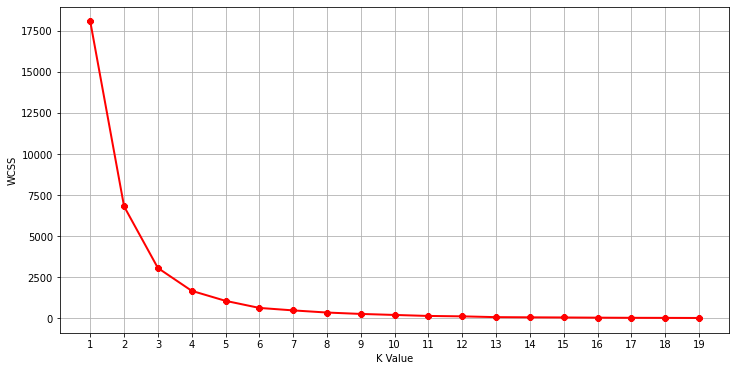

In [ ]:
from sklearn.cluster import KMeans
wcss = []
for k in range(1,20):
    kmeans = KMeans(n_clusters=k, init="k-means++")
    kmeans.fit(df_po_vs_shipment_agg_stat[['generic_cust_item_id','dlv_units_cv_times_cnt']].iloc[:,1:])
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(12,6))    
plt.grid()
plt.plot(range(1,20),wcss, linewidth=2, color="red", marker ="8")
plt.xlabel("K Value")
plt.xticks(np.arange(1,20,1))
plt.ylabel("WCSS")
plt.show()

In [ ]:
#Fitting K-MEans to the dataset
kmeans=KMeans(n_clusters=3,init='k-means++',random_state=0)
y_kmeans=kmeans.fit_predict(df_po_vs_shipment_agg_stat[['dlv_units_cv_times_cnt']])
y_kmeans

new_df = df_po_vs_shipment_agg_stat[['generic_cust_item_id','dlv_units_cv_times_cnt']]
new_df['cluster_number'] = y_kmeans
new_df

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,generic_cust_item_id,dlv_units_cv_times_cnt,cluster_number
33,33,28.390302502619079,0
51,51,46.737158175377360,0
71,71,44.019092006461449,0
72,72,39.790130624567972,0
73,73,47.284864042865948,0
74,74,41.912241142233874,0
81,81,40.815470981567572,0
106,106,69.431171242187290,2
107,107,34.395596837065185,0
109,109,50.573520943493691,2


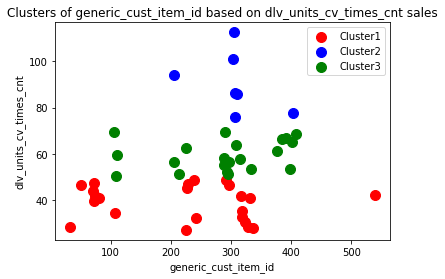

In [ ]:
plt.scatter(new_df[new_df.cluster_number ==0]['generic_cust_item_id'],new_df[new_df.cluster_number ==0]['dlv_units_cv_times_cnt'],s=100,c='red',label='Cluster1')
plt.scatter(new_df[new_df.cluster_number ==1]['generic_cust_item_id'],new_df[new_df.cluster_number ==1]['dlv_units_cv_times_cnt'],s=100,c='blue',label='Cluster2')
plt.scatter(new_df[new_df.cluster_number ==2]['generic_cust_item_id'],new_df[new_df.cluster_number ==2]['dlv_units_cv_times_cnt'],s=100,c='green',label='Cluster3')
#plt.scatter(new_df[new_df.cluster_number ==3]['generic_cust_item_id'],new_df[new_df.cluster_number ==3]['dlv_units_cv_times_cnt'],s=100,c='orange',label='Cluster4')

plt.title('Clusters of generic_cust_item_id based on dlv_units_cv_times_cnt sales')
plt.xlabel('generic_cust_item_id')
plt.ylabel('dlv_units_cv_times_cnt')
plt.legend()

plt.show()

In [ ]:
#df_final_0 = df_po_vs_shipment_agg[(df_po_vs_shipment_agg['generic_cust_item_id'].isin(new_df[new_df.cluster_number == 0].generic_cust_item_id.to_list()))]
df_final_1 = df_po_vs_shipment_agg[(df_po_vs_shipment_agg['generic_cust_item_id'].isin(new_df[new_df.cluster_number == 1].generic_cust_item_id.to_list()))]
df_final_2 = df_po_vs_shipment_agg[(df_po_vs_shipment_agg['generic_cust_item_id'].isin(new_df[new_df.cluster_number == 2].generic_cust_item_id.to_list()))]
#df_final = pd.concat([df_final_0, df_final_1, df_final_2])
df_final = pd.concat([df_final_1, df_final_2])
df_final.head()

,generic_cust_item_id,dlv_units
fscl_wk_end_dt,,
2017-11-25,206,150
2017-12-02,206,460
2017-12-09,206,30
2018-01-27,206,75
2018-02-17,206,150


In [ ]:
df_bottom_level = df_final.pivot(columns="generic_cust_item_id", values="dlv_units")
df_bottom_level = df_bottom_level.fillna(0)
df_bottom_level.columns = ['generic_cust_item_id_' + str(c) for c in df_bottom_level.columns]
df_bottom_level.head()

,generic_cust_item_id_106,generic_cust_item_id_109,generic_cust_item_id_110,generic_cust_item_id_205,generic_cust_item_id_206,generic_cust_item_id_213,generic_cust_item_id_225,generic_cust_item_id_288,generic_cust_item_id_289,generic_cust_item_id_290,generic_cust_item_id_292,generic_cust_item_id_294,generic_cust_item_id_295,generic_cust_item_id_297,generic_cust_item_id_304,generic_cust_item_id_305,generic_cust_item_id_306,generic_cust_item_id_307,generic_cust_item_id_309,generic_cust_item_id_310,generic_cust_item_id_315,generic_cust_item_id_333,generic_cust_item_id_376,generic_cust_item_id_384,generic_cust_item_id_391,generic_cust_item_id_398,generic_cust_item_id_401,generic_cust_item_id_403,generic_cust_item_id_408
fscl_wk_end_dt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-11-18,0.000000000000000,30.000000000000000,75.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,160.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,145.000000000000000,144.000000000000000,10.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,160.000000000000000,150.000000000000000,0.000000000000000,60.000000000000000,75.000000000000000,75.000000000000000,75.000000000000000,150.000000000000000,105.000000000000000
2017-11-25,1050.000000000000000,0.000000000000000,0.000000000000000,40.000000000000000,150.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,30.000000000000000,45.000000000000000,600.000000000000000,165.000000000000000,200.000000000000000,30.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,160.000000000000000,150.000000000000000,8.000000000000000,100.000000000000000,33.000000000000000,78.000000000000000,80.000000000000000,240.000000000000000,55.000000000000000
2017-12-02,0.000000000000000,0.000000000000000,0.000000000000000,200.000000000000000,460.000000000000000,25.000000000000000,0.000000000000000,98.000000000000000,150.000000000000000,225.000000000000000,0.000000000000000,275.000000000000000,452.000000000000000,50.000000000000000,150.000000000000000,255.000000000000000,240.000000000000000,240.000000000000000,30.000000000000000,8.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
2017-12-09,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,30.000000000000000,0.000000000000000,20.000000000000000,90.000000000000000,150.000000000000000,300.000000000000000,0.000000000000000,400.000000000000000,400.000000000000000,100.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,240.000000000000000,240.000000000000000,2.000000000000000,40.000000000000000,15.000000000000000,30.000000000000000,20.000000000000000,60.000000000000000,30.000000000000000
2017-12-16,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,40.000000000000000,0.000000000000000,90.000000000000000,30.000000000000000,150.000000000000000,45.000000000000000,30.000000000000000,7.000000000000000,210.000000000000000,105.000000000000000,315.000000000000000,105.000000000000000,15.000000000000000,30.000000000000000,160.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000


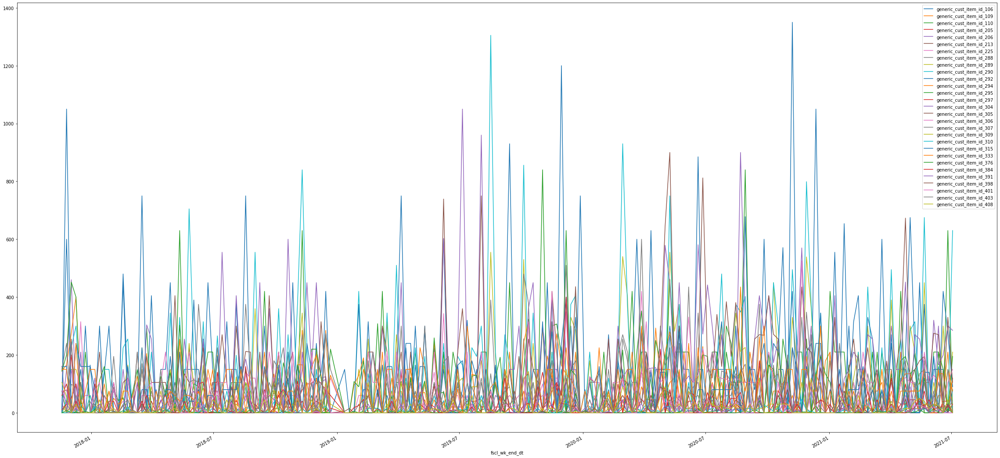

In [ ]:
df_bottom_level.plot(figsize = (40,20))

In [ ]:
df_po_vs_shipment_agg.groupby("uch_level_g")["basecode"].apply(set).to_frame()

KeyError: ignored

In [ ]:
df_middle_level_1 = df_final.reset_index().groupby(["fscl_wk_end_dt","uch_level_g"])[["dlv_units"]].agg(["sum"]).reset_index()
df_middle_level_1.columns = ['fscl_wk_end_dt','uch_level_g', 'dlv_units']
df_middle_level_1 = df_middle_level_1.pivot(index="fscl_wk_end_dt", columns="uch_level_g", values="dlv_units")
df_middle_level_1 = df_middle_level_1.fillna(0)
df_middle_level_1.columns = ['cust_' + c for c in df_middle_level_1]
df_middle_level_1.head()

,cust_CA4000320,cust_CA4000324,cust_CA4000326,cust_CA4000327,cust_CA4000342,cust_CA4000350,cust_CA4000358,cust_CA4000362,cust_CA4000364,cust_CA4000366,cust_CA4000388,cust_CA4000397,cust_CA4000401,cust_CA4000408,cust_CA4000409,cust_CA4000410,cust_CA4000435,cust_CA4000441,cust_CA4000446,cust_CA4000663,cust_CA4000743,cust_CA4000806,cust_CA4000950,cust_CA4000965,cust_CA4001013,cust_CA4001025,cust_CA4001077,cust_CA4001079,cust_CA4001180,cust_CA4001193,cust_CA4001315
fscl_wk_end_dt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-11-18,0.000000000000000,0.000000000000000,15.000000000000000,0.000000000000000,111.000000000000000,80.000000000000000,0.000000000000000,0.000000000000000,465.000000000000000,0.000000000000000,160.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,70.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,465.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,158.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
2017-11-25,76.000000000000000,765.000000000000000,45.000000000000000,10.000000000000000,0.000000000000000,1450.000000000000000,0.000000000000000,1030.000000000000000,273.000000000000000,150.000000000000000,0.000000000000000,50.000000000000000,105.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,55.000000000000000,0.000000000000000,0.000000000000000,8.000000000000000,0.000000000000000,579.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
2017-12-02,0.000000000000000,0.000000000000000,50.000000000000000,0.000000000000000,60.000000000000000,0.000000000000000,540.000000000000000,0.000000000000000,2081.000000000000000,476.000000000000000,0.000000000000000,0.000000000000000,285.000000000000000,2.000000000000000,0.000000000000000,923.000000000000000,5.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,278.000000000000000,200.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,165.000000000000000
2017-12-09,0.000000000000000,45.000000000000000,225.000000000000000,5.000000000000000,45.000000000000000,0.000000000000000,0.000000000000000,150.000000000000000,125.000000000000000,55.000000000000000,20.000000000000000,73.000000000000000,580.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,55.000000000000000,0.000000000000000,0.000000000000000,2.000000000000000,0.000000000000000,304.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000
2017-12-16,0.000000000000000,0.000000000000000,240.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,10.000000000000000,53.000000000000000,0.000000000000000,70.000000000000000,0.000000000000000,0.000000000000000,780.000000000000000,30.000000000000000,673.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,375.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,16.000000000000000


In [ ]:
df_middle_level_2 = df_final.reset_index().groupby(["fscl_wk_end_dt","basecode"])[["dlv_units"]].agg(["sum"]).reset_index()
df_middle_level_2.columns = ['fscl_wk_end_dt','basecode', 'dlv_units']
df_middle_level_2 = df_middle_level_2.pivot(index="fscl_wk_end_dt", columns="basecode", values="dlv_units")
df_middle_level_2 = df_middle_level_2.fillna(0)
df_middle_level_2.columns = ['basecode_' + str(c) for c in df_middle_level_2]
df_middle_level_2.head()

KeyError: ignored

In [ ]:
df_top_level = df_final.reset_index().groupby(["fscl_wk_end_dt"])[["dlv_units"]].agg(["sum"]).reset_index()
df_top_level.columns = ['fscl_wk_end_dt','total']
#df_top_level = df_top.pivot(index="fscl_wk_end_dt", columns="uch_level_g", values="dlv_units")
df_top_level = df_top_level.fillna(0).set_index('fscl_wk_end_dt')
df_top_level.head()

,total
fscl_wk_end_dt,
2017-11-18,1524
2017-11-25,4596
2017-12-02,5065
2017-12-09,1684
2017-12-16,2247


In [ ]:
# join the DataFrames
hierarchy_df = df_bottom_level.join(df_middle_level_1).join(df_middle_level_2).join(df_top_level)
#hierarchy_df = df_bottom_level.join(df_middle_level_1).join(df_top_level)
hierarchy_df.index = pd.to_datetime(hierarchy_df.index)
hierarchy_df = hierarchy_df.resample("QS").sum()

print(f"Number of time series at the bottom level: {df_bottom_level.shape[1]}")
print(f"Number of time series at the middle level_1: {df_middle_level_1.shape[1]}")
print(f"Number of time series at the middle level_2: {df_middle_level_2.shape[1]}")

hierarchy_df.head()

Number of time series at the bottom level: 324
Number of time series at the middle level_1: 31
Number of time series at the middle level_2: 49


,generic_cust_item_id_0,generic_cust_item_id_1,generic_cust_item_id_2,generic_cust_item_id_3,generic_cust_item_id_4,generic_cust_item_id_5,generic_cust_item_id_6,generic_cust_item_id_11,generic_cust_item_id_12,generic_cust_item_id_13,generic_cust_item_id_14,generic_cust_item_id_15,generic_cust_item_id_16,generic_cust_item_id_17,generic_cust_item_id_18,generic_cust_item_id_19,generic_cust_item_id_20,generic_cust_item_id_21,generic_cust_item_id_22,generic_cust_item_id_23,generic_cust_item_id_24,generic_cust_item_id_26,generic_cust_item_id_27,generic_cust_item_id_28,generic_cust_item_id_32,generic_cust_item_id_34,generic_cust_item_id_35,generic_cust_item_id_36,generic_cust_item_id_38,generic_cust_item_id_40,generic_cust_item_id_42,generic_cust_item_id_43,generic_cust_item_id_44,generic_cust_item_id_50,generic_cust_item_id_53,generic_cust_item_id_55,generic_cust_item_id_56,generic_cust_item_id_57,generic_cust_item_id_59,generic_cust_item_id_60,...,basecode_681000186300,basecode_681008938400,basecode_681008958000,basecode_681008958200,basecode_681008958300,basecode_681008958500,basecode_681008958600,basecode_681008958800,basecode_681008958900,basecode_681008959000,basecode_681008959100,basecode_681008959300,basecode_681008959400,basecode_681008959500,basecode_681008959700,basecode_681008960600,basecode_681008960700,basecode_681008962600,basecode_681008962700,basecode_681008962800,basecode_681008963100,basecode_681008963300,basecode_681008963400,basecode_681008964400,basecode_681008964900,basecode_681008965000,basecode_681008965100,basecode_681008975100,basecode_681008986600,basecode_681008986700,basecode_681008987200,basecode_681008994400,basecode_681008994500,basecode_681008999400,basecode_681009006400,basecode_681009006600,basecode_681009006700,basecode_681009013200,basecode_681009016000,total
fscl_wk_end_dt,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-10-01,72.000000000000000,31.000000000000000,29.000000000000000,24.000000000000000,0.000000000000000,60.000000000000000,140.000000000000000,90.000000000000000,165.000000000000000,0.000000000000000,0.000000000000000,30.000000000000000,0.000000000000000,60.000000000000000,90.000000000000000,75.000000000000000,0.000000000000000,90.000000000000000,0.000000000000000,0.000000000000000,10.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,360.000000000000000,60.000000000000000,60.000000000000000,45.000000000000000,45.000000000000000,75.000000000000000,45.000000000000000,5.000000000000000,0.000000000000000,75.000000000000000,60.000000000000000,15.000000000000000,5.000000000000000,5.000000000000000,5.000000000000000,0.000000000000000,...,93.000000000000000,313.000000000000000,2678.000000000000000,177.000000000000000,134.000000000000000,251.000000000000000,72.000000000000000,42.000000000000000,10.000000000000000,1085.000000000000000,110.000000000000000,92.000000000000000,649.000000000000000,109.000000000000000,4535.000000000000000,45.000000000000000,0.000000000000000,174.000000000000000,195.000000000000000,120.000000000000000,140.000000000000000,475.000000000000000,225.000000000000000,15.000000000000000,54.000000000000000,105.000000000000000,325.000000000000000,159.000000000000000,218.000000000000000,38.000000000000000,73.000000000000000,33.000000000000000,63.000000000000000,58.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,19811
2018-01-01,75.000000000000000,58.000000000000000,44.000000000000000,29.000000000000000,0.000000000000000,40.000000000000000,180.000000000000000,255.000000000000000,180.000000000000000,0.000000000000000,0.000000000000000,15.000000000000000,0.000000000000000,0.000000000000000,210.000000000000000,345.000000000000000,0.000000000000000,240.000000000000000,0.000000000000000,0.000000000000000,0.000000000000000,45.000000000000000,45.000000000000000,0.000000000000000,0.000000000000000,60.000000000000000,90.000000000000000,120.000000000000000,45.00000000000000

In [ ]:
uch_level_g = df_final["uch_level_g"].unique()
basecode = df_final["basecode"].unique()

total_cust = {'total_cust': ['cust_' + c for c in list(uch_level_g)]}
total_basecode = {'total_basecode': ['basecode_' + str(b) for b in list(basecode)]}

total_cust_basecode = {'cust_' + c: ['basecode_' + str(b[1]) for b in df_final.groupby(['uch_level_g','basecode','generic_cust_item_id'])[["dlv_units"]].agg(["sum"]).reset_index()[['uch_level_g','basecode','generic_cust_item_id']].to_numpy() if b[0]==c] for c in uch_level_g}
total_basecode_cust = {'basecode_' + str(b): ['cust_' + c[0] for c in df_final.groupby(['uch_level_g','basecode','generic_cust_item_id'])[["dlv_units"]].agg(["sum"]).reset_index()[['uch_level_g','basecode','generic_cust_item_id']].to_numpy() if c[1]==b] for b in basecode}

hierarchy = {**total_cust, **total_basecode, **total_cust_basecode, **total_basecode_cust}

hierarchy

{'basecode_681000026800': ['cust_CA4000364',
  'cust_CA4000366',
  'cust_CA4000397',
  'cust_CA4000435',
  'cust_CA4000806',
  'cust_CA4001025',
  'cust_CA4001077'],
 'basecode_681000027000': ['cust_CA4000350',
  'cust_CA4000366',
  'cust_CA4000397',
  'cust_CA4000435',
  'cust_CA4000806',
  'cust_CA4001077'],
 'basecode_681000027300': ['cust_CA4000350',
  'cust_CA4000358',
  'cust_CA4000364',
  'cust_CA4000366',
  'cust_CA4000397',
  'cust_CA4000435',
  'cust_CA4000806',
  'cust_CA4001025'],
 'basecode_681000033200': ['cust_CA4000324', 'cust_CA4000350'],
 'basecode_681000111700': ['cust_CA4000324',
  'cust_CA4000326',
  'cust_CA4000350',
  'cust_CA4000358',
  'cust_CA4000362',
  'cust_CA4000364',
  'cust_CA4000388',
  'cust_CA4000401',
  'cust_CA4000446',
  'cust_CA4000950',
  'cust_CA4000965',
  'cust_CA4001025',
  'cust_CA4001077'],
 'basecode_681000112500': ['cust_CA4000324',
  'cust_CA4000358',
  'cust_CA4000362',
  'cust_CA4000364',
  'cust_CA4000388',
  'cust_CA4000446',
  'cust

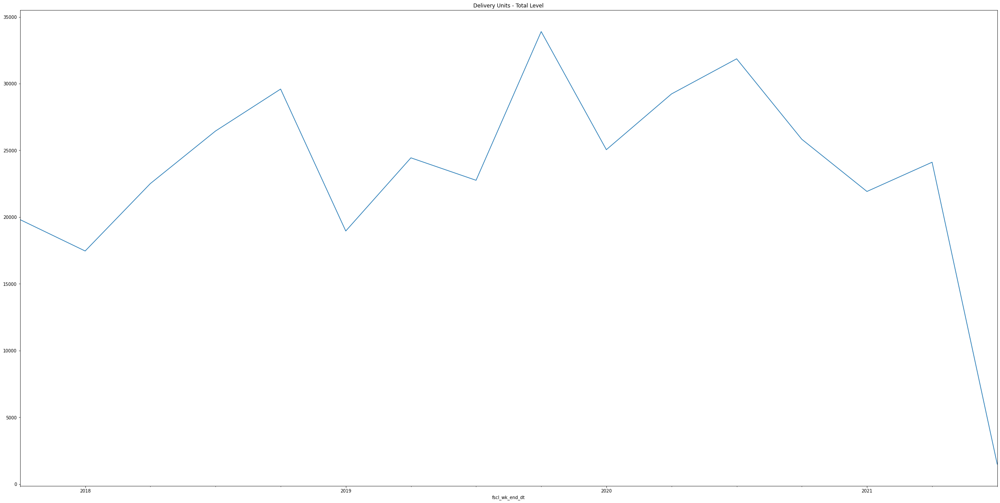

In [ ]:
hierarchy_df["total"].plot(title="Delivery Units - Total Level", figsize = (40,20));

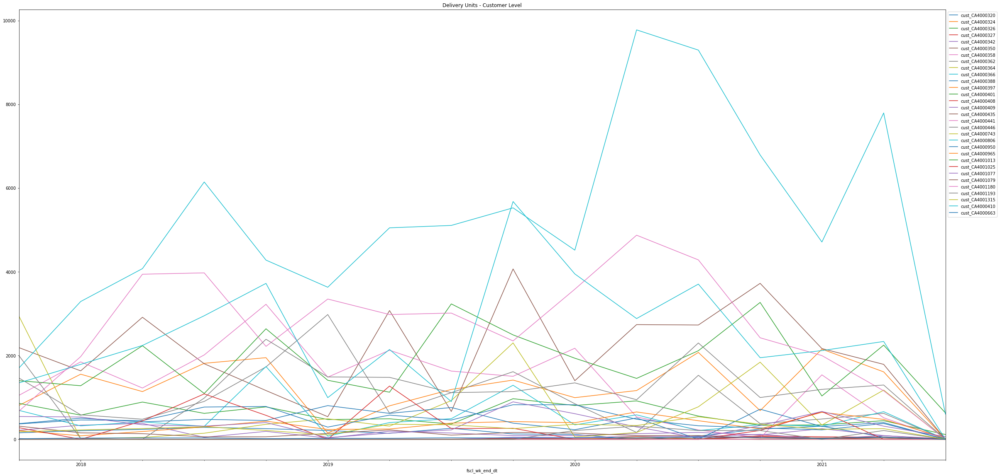

In [ ]:
ax = hierarchy_df[hierarchy['total_cust']].plot(title="Delivery Units - Customer Level", figsize = (40,20))
ax.legend(bbox_to_anchor=(1.0, 1.0));

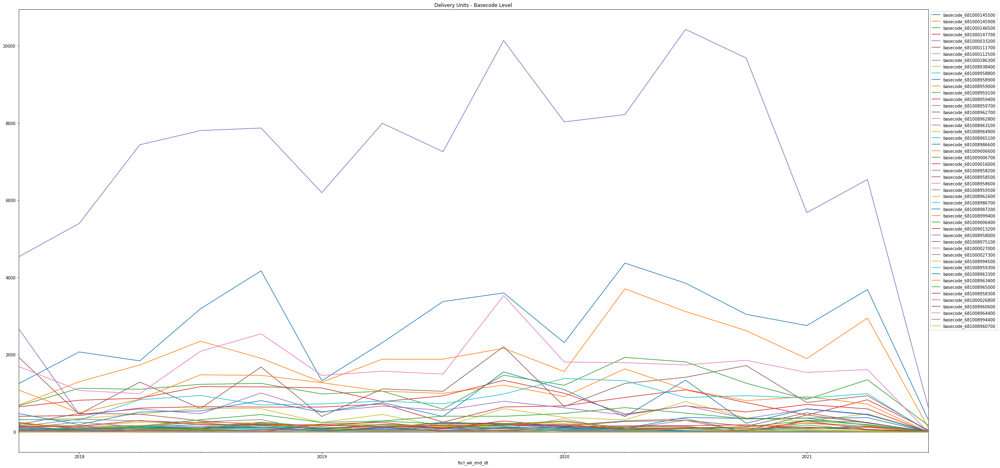

In [ ]:
ax = hierarchy_df[hierarchy['total_basecode']].plot(title="Delivery Units - Basecode Level", figsize = (40,20))
ax.legend(bbox_to_anchor=(1.0, 1.0));

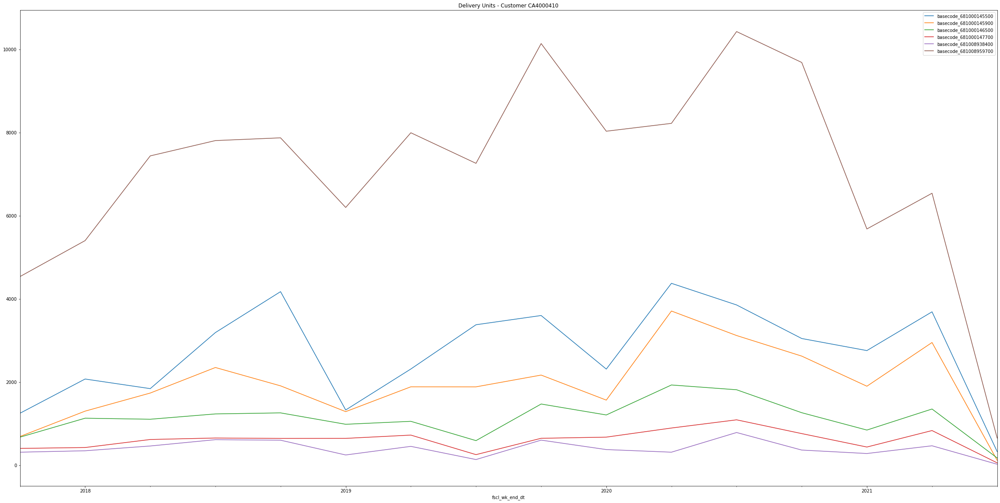

In [ ]:
ax = hierarchy_df[hierarchy['cust_CA4000410']].plot(title="Delivery Units - Customer CA4000410", figsize = (40,20))
ax.legend(bbox_to_anchor=(1.0, 1.0));

In [ ]:
ax = hierarchy_df[hierarchy['basecode_681008994400']].plot(title="Delivery Units - Basecode 681008994400")
ax.legend(bbox_to_anchor=(1.0, 1.0));

NameError: ignored

In [ ]:
original_df_bottom_level = df_bottom_level.copy()
df_bottom_level = df_bottom_level.asfreq('W-Sat')


In [ ]:
'''
dataset_train = df_bottom_level[df_bottom_level.index <= '2020-12-26']
data_unseen = df_bottom_level[df_bottom_level.index > '2020-12-26']
dataset_train.reset_index(inplace=True)
dataset_train.info()
'''

"\ndataset_train = df_bottom_level[df_bottom_level.index <= '2020-12-26']\ndata_unseen = df_bottom_level[df_bottom_level.index > '2020-12-26']\ndataset_train.reset_index(inplace=True)\ndataset_train.info()\n"

In [ ]:
'''
#dataset_train = df_bottom_level[df_bottom_level.index <= '2020-12-26']
#data_unseen = df_bottom_level[df_bottom_level.index > '2020-12-26']
df_bottom_level = df_final.pivot(columns="generic_cust_item_id", values="dlv_units")
df_bottom_level = df_bottom_level.fillna(0)
df_bottom_level.columns = ['generic_cust_item_id_' + str(c) for c in df_bottom_level.columns]
df_bottom_level.head()

df_bottom_level.reset_index(inplace=True)
for c in df_bottom_level.columns[2:]:
    #print(c)
    temp_df = dataset_train[['fscl_wk_end_dt', c]]
    series_data = TimeSeries.from_dataframe(temp_df, 'fscl_wk_end_dt', c)
    traindata, testdata = series_data.split_before(pd.Timestamp('2020-12-26'))
    series_model = ExponentialSmoothing()
    series_model.fit(traindata)
    prediction = series_model.predict(len(testdata))
    series_data.plot(label='actual')
    prediction.plot(label='forecast', lw=3)
    plt.legend()
    #print("predicted" ,prediction[:5])
    #print("actual",testdata[:5])
'''

'\n#dataset_train = df_bottom_level[df_bottom_level.index <= \'2020-12-26\']\n#data_unseen = df_bottom_level[df_bottom_level.index > \'2020-12-26\']\ndf_bottom_level = df_final.pivot(columns="generic_cust_item_id", values="dlv_units")\ndf_bottom_level = df_bottom_level.fillna(0)\ndf_bottom_level.columns = [\'generic_cust_item_id_\' + str(c) for c in df_bottom_level.columns]\ndf_bottom_level.head()\n\ndf_bottom_level.reset_index(inplace=True)\nfor c in df_bottom_level.columns[2:]:\n    #print(c)\n    temp_df = dataset_train[[\'fscl_wk_end_dt\', c]]\n    series_data = TimeSeries.from_dataframe(temp_df, \'fscl_wk_end_dt\', c)\n    traindata, testdata = series_data.split_before(pd.Timestamp(\'2020-12-26\'))\n    series_model = ExponentialSmoothing()\n    series_model.fit(traindata)\n    prediction = series_model.predict(len(testdata))\n    series_data.plot(label=\'actual\')\n    prediction.plot(label=\'forecast\', lw=3)\n    plt.legend()\n    #print("predicted" ,prediction[:5])\n    #print

In [ ]:
import logging
logger = logging.getLogger()
logger.handlers = []

In [ ]:
from IPython.display import display

In [ ]:
# create a model to plot the hierarchy.
import pyaf.HierarchicalForecastEngine as hautof
import pyaf.ForecastEngine as autof
lEngine = hautof.cHierarchicalForecastEngine()

In [ ]:
df_cust_basecode = pd.DataFrame()
for k in total_cust_basecode.keys():
    basecode_list = total_cust_basecode[k]
    for b in basecode_list:
        list_of_row_tuple = [(k,b)]
        temp_df = pd.DataFrame(data=list_of_row_tuple, columns = ['cust', 'basecode'])
        df_cust_basecode = df_cust_basecode.append(temp_df)

df_cust_basecode = df_cust_basecode.reset_index()
df_cust_basecode =  df_cust_basecode[['cust', 'basecode']]
df_cust_basecode

,cust,basecode
0,cust_CA4000320,basecode_681000145500
1,cust_CA4000320,basecode_681000145900
2,cust_CA4000320,basecode_681000146500
3,cust_CA4000320,basecode_681000147700
4,cust_CA4000324,basecode_681000033200
...,...,...
319,cust_CA4000410,basecode_681000146500
320,cust_CA4000410,basecode_681000147700
321,cust_CA4000410,basecode_681008938400
322,cust_CA4000410,basecode_681008959700


In [ ]:
df_basecode_cust = pd.DataFrame()
for k in total_basecode_cust.keys():
    cust_list = total_basecode_cust[k]
    #print(cust_list)
    for c in cust_list:
        temp_df = pd.DataFrame(data=[(k, c)])
        df_basecode_cust = df_basecode_cust.append(temp_df)

df_basecode_cust.reset_index(inplace=True)
df_basecode_cust.drop(columns=['index'], inplace=True)
df_basecode_cust.columns = ['basecode','cust']
df_basecode_cust

,basecode,cust
0,basecode_681000145500,cust_CA4000320
1,basecode_681000145500,cust_CA4000326
2,basecode_681000145500,cust_CA4000327
3,basecode_681000145500,cust_CA4000358
4,basecode_681000145500,cust_CA4000362
...,...,...
319,basecode_681008994400,cust_CA4000397
320,basecode_681008994400,cust_CA4000435
321,basecode_681008994400,cust_CA4000806
322,basecode_681008994400,cust_CA4001077


In [ ]:
#Customer Hierarchy
lCHierarchy = {};
x = df_final.reset_index()[['uch_level_g', 'basecode']].groupby(['uch_level_g', 'basecode']).size().reset_index()[['uch_level_g', 'basecode']]
x['uch_level_g'] = 'cust_' + x['uch_level_g']
x['basecode'] = 'basecode_' + x['basecode'].astype(str)
x['uch_level_g_basecode'] = x['uch_level_g'] + '_' + x['basecode']
x = x[['uch_level_g_basecode','uch_level_g']]
x
lCHierarchy['Data'] = x#x.pivot(index='uch_level_g', columns='uch_level_g_basecode',values='uch_level_g').fillna('0')
lCHierarchy['Levels'] = ['uch_level_g_basecode','cust'];
lCHierarchy['Type'] = "Hierarchical";
lCHierarchy

{'Data':                      uch_level_g_basecode     uch_level_g
 0    cust_CA4000320_basecode_681000145500  cust_CA4000320
 1    cust_CA4000320_basecode_681000145900  cust_CA4000320
 2    cust_CA4000320_basecode_681000146500  cust_CA4000320
 3    cust_CA4000320_basecode_681000147700  cust_CA4000320
 4    cust_CA4000324_basecode_681000033200  cust_CA4000324
 ..                                    ...             ...
 319  cust_CA4001079_basecode_681008965100  cust_CA4001079
 320  cust_CA4001180_basecode_681000112500  cust_CA4001180
 321  cust_CA4001193_basecode_681008965100  cust_CA4001193
 322  cust_CA4001315_basecode_681008958900  cust_CA4001315
 323  cust_CA4001315_basecode_681008959700  cust_CA4001315
 
 [324 rows x 2 columns],
 'Levels': ['uch_level_g_basecode', 'cust'],
 'Type': 'Hierarchical'}

INFO:pyaf.std:START_HIERARCHICAL_PLOTTING


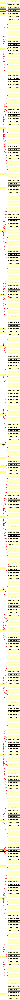

INFO:pyaf.std:END_HIERARCHICAL_PLOTTING_TIME_IN_SECONDS 1.5880558490753174


In [ ]:
#Customer level basecode breakdown
lCSignalHierarchy = lEngine.plot_Hierarchy(df_bottom_level , "fscl_wk_end_dt", "Signal", 52, lCHierarchy, None);

In [ ]:
lCSignalHierarchy.mStructure

{0: {'cust_CA4000320_basecode_681000145500': [],
  'cust_CA4000320_basecode_681000145900': [],
  'cust_CA4000320_basecode_681000146500': [],
  'cust_CA4000320_basecode_681000147700': [],
  'cust_CA4000324_basecode_681000033200': [],
  'cust_CA4000324_basecode_681000111700': [],
  'cust_CA4000324_basecode_681000112500': [],
  'cust_CA4000324_basecode_681000186300': [],
  'cust_CA4000324_basecode_681008938400': [],
  'cust_CA4000324_basecode_681008958800': [],
  'cust_CA4000324_basecode_681008958900': [],
  'cust_CA4000324_basecode_681008959000': [],
  'cust_CA4000324_basecode_681008959100': [],
  'cust_CA4000324_basecode_681008959400': [],
  'cust_CA4000324_basecode_681008959700': [],
  'cust_CA4000324_basecode_681008962700': [],
  'cust_CA4000324_basecode_681008962800': [],
  'cust_CA4000324_basecode_681008963100': [],
  'cust_CA4000324_basecode_681008964900': [],
  'cust_CA4000324_basecode_681008965100': [],
  'cust_CA4000324_basecode_681008986600': [],
  'cust_CA4000324_basecode_6810

In [ ]:
lBHierarchy = {};
x = df_final.reset_index()[['uch_level_g', 'basecode']].groupby(['uch_level_g', 'basecode']).size().reset_index()[['uch_level_g', 'basecode']]
x['uch_level_g'] = 'cust_' + x['uch_level_g']
x['basecode'] = 'basecode_' + x['basecode'].astype(str)
x['uch_level_g_basecode'] = x['uch_level_g'] + '_' + x['basecode']
x = x[['uch_level_g_basecode','basecode']]
x
lBHierarchy['Data'] = x
lBHierarchy['Levels'] = ['uch_level_g_basecode','basecode'];
lBHierarchy['Type'] = "Hierarchical";
lBHierarchy

{'Data':                      uch_level_g_basecode               basecode
 0    cust_CA4000320_basecode_681000145500  basecode_681000145500
 1    cust_CA4000320_basecode_681000145900  basecode_681000145900
 2    cust_CA4000320_basecode_681000146500  basecode_681000146500
 3    cust_CA4000320_basecode_681000147700  basecode_681000147700
 4    cust_CA4000324_basecode_681000033200  basecode_681000033200
 ..                                    ...                    ...
 319  cust_CA4001079_basecode_681008965100  basecode_681008965100
 320  cust_CA4001180_basecode_681000112500  basecode_681000112500
 321  cust_CA4001193_basecode_681008965100  basecode_681008965100
 322  cust_CA4001315_basecode_681008958900  basecode_681008958900
 323  cust_CA4001315_basecode_681008959700  basecode_681008959700
 
 [324 rows x 2 columns],
 'Levels': ['uch_level_g_basecode', 'basecode'],
 'Type': 'Hierarchical'}

INFO:pyaf.std:START_HIERARCHICAL_PLOTTING


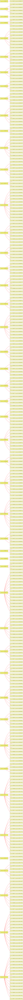

INFO:pyaf.std:END_HIERARCHICAL_PLOTTING_TIME_IN_SECONDS 1.9106364250183105


In [ ]:
#Basecode level customer breakdown
lBSignalHierarchy = lEngine.plot_Hierarchy(df_bottom_level , "fscl_wk_end_dt", "Signal", 52, lBHierarchy, None);

In [ ]:
lBSignalHierarchy.mStructure

{0: {'cust_CA4000320_basecode_681000145500': [],
  'cust_CA4000320_basecode_681000145900': [],
  'cust_CA4000320_basecode_681000146500': [],
  'cust_CA4000320_basecode_681000147700': [],
  'cust_CA4000324_basecode_681000033200': [],
  'cust_CA4000324_basecode_681000111700': [],
  'cust_CA4000324_basecode_681000112500': [],
  'cust_CA4000324_basecode_681000186300': [],
  'cust_CA4000324_basecode_681008938400': [],
  'cust_CA4000324_basecode_681008958800': [],
  'cust_CA4000324_basecode_681008958900': [],
  'cust_CA4000324_basecode_681008959000': [],
  'cust_CA4000324_basecode_681008959100': [],
  'cust_CA4000324_basecode_681008959400': [],
  'cust_CA4000324_basecode_681008959700': [],
  'cust_CA4000324_basecode_681008962700': [],
  'cust_CA4000324_basecode_681008962800': [],
  'cust_CA4000324_basecode_681008963100': [],
  'cust_CA4000324_basecode_681008964900': [],
  'cust_CA4000324_basecode_681008965100': [],
  'cust_CA4000324_basecode_681008986600': [],
  'cust_CA4000324_basecode_6810

In [ ]:
df_final['uch_level_g_basecode'] = 'cust_' + df_final['uch_level_g'] + '_basecode_' + df_final['basecode'].astype(str)
pd.get_dummies(df_final[['uch_level_g_basecode']])

,uch_level_g_basecode_cust_CA4000320_basecode_681000145500,uch_level_g_basecode_cust_CA4000320_basecode_681000145900,uch_level_g_basecode_cust_CA4000320_basecode_681000146500,uch_level_g_basecode_cust_CA4000320_basecode_681000147700,uch_level_g_basecode_cust_CA4000324_basecode_681000033200,uch_level_g_basecode_cust_CA4000324_basecode_681000111700,uch_level_g_basecode_cust_CA4000324_basecode_681000112500,uch_level_g_basecode_cust_CA4000324_basecode_681000186300,uch_level_g_basecode_cust_CA4000324_basecode_681008938400,uch_level_g_basecode_cust_CA4000324_basecode_681008958800,uch_level_g_basecode_cust_CA4000324_basecode_681008958900,uch_level_g_basecode_cust_CA4000324_basecode_681008959000,uch_level_g_basecode_cust_CA4000324_basecode_681008959100,uch_level_g_basecode_cust_CA4000324_basecode_681008959400,uch_level_g_basecode_cust_CA4000324_basecode_681008959700,uch_level_g_basecode_cust_CA4000324_basecode_681008962700,uch_level_g_basecode_cust_CA4000324_basecode_681008962800,uch_level_g_basecode_cust_CA4000324_basecode_681008963100,uch_level_g_basecode_cust_CA4000324_basecode_681008964900,uch_level_g_basecode_cust_CA4000324_basecode_681008965100,uch_level_g_basecode_cust_CA4000324_basecode_681008986600,uch_level_g_basecode_cust_CA4000324_basecode_681009006600,uch_level_g_basecode_cust_CA4000324_basecode_681009006700,uch_level_g_basecode_cust_CA4000324_basecode_681009016000,uch_level_g_basecode_cust_CA4000326_basecode_681000111700,uch_level_g_basecode_cust_CA4000326_basecode_681000145500,uch_level_g_basecode_cust_CA4000326_basecode_681000145900,uch_level_g_basecode_cust_CA4000326_basecode_681000146500,uch_level_g_basecode_cust_CA4000326_basecode_681008938400,uch_level_g_basecode_cust_CA4000326_basecode_681008958200,uch_level_g_basecode_cust_CA4000326_basecode_681008958500,uch_level_g_basecode_cust_CA4000326_basecode_681008958600,uch_level_g_basecode_cust_CA4000326_basecode_681008958800,uch_level_g_basecode_cust_CA4000326_basecode_681008959500,uch_level_g_basecode_cust_CA4000326_basecode_681008962600,uch_level_g_basecode_cust_CA4000326_basecode_681008986600,uch_level_g_basecode_cust_CA4000326_basecode_681008986700,uch_level_g_basecode_cust_CA4000326_basecode_681008987200,uch_level_g_basecode_cust_CA4000326_basecode_681008999400,uch_level_g_basecode_cust_CA4000326_basecode_681009006400,...,uch_level_g_basecode_cust_CA4001025_basecode_681008962700,uch_level_g_basecode_cust_CA4001025_basecode_681008963100,uch_level_g_basecode_cust_CA4001025_basecode_681008963300,uch_level_g_basecode_cust_CA4001025_basecode_681008963400,uch_level_g_basecode_cust_CA4001025_basecode_681008964900,uch_level_g_basecode_cust_CA4001025_basecode_681008965000,uch_level_g_basecode_cust_CA4001025_basecode_681008965100,uch_level_g_basecode_cust_CA4001025_basecode_681008986600,uch_level_g_basecode_cust_CA4001025_basecode_681008986700,uch_level_g_basecode_cust_CA4001025_basecode_681008987200,uch_level_g_basecode_cust_CA4001025_basecode_681009006400,uch_level_g_basecode_cust_CA4001025_basecode_681009006600,uch_level_g_basecode_cust_CA4001025_basecode_681009006700,uch_level_g_basecode_cust_CA4001077_basecode_681000026800,uch_level_g_basecode_cust_CA4001077_basecode_681000027000,uch_level_g_basecode_cust_CA4001077_basecode_681000111700,uch_level_g_basecode_cust_CA4001077_basecode_681000112500,uch_level_g_basecode_cust_CA4001077_basecode_681000145500,uch_level_g_basecode_cust_CA4001077_basecode_681000145900,uch_level_g_basecode_cust_CA4001077_basecode_681000146500,uch_level_g_basecode_cust_CA4001077_basecode_681000147700,uch_level_g_basecode_cust_CA4001077_basecode_681008938400,uch_level_g_basecode_cust_CA4001077_basecode_681008958000,uch_level_g_basecode_cust_CA4001077_basecode_681008958300,uch_level_g_basecode_cust_CA4001077_basecode_681008958500,uch_level_g_basecode_cust_CA4001077_basecode_681008959100,uch_level_g_basecode_cust_CA4001077_basecode_681008959300,uch_level_g_basecode_cust_CA4001077_basecode_681008962600,uch_level_g_basecode_cust_CA4001077_basecode_681008

In [ ]:
col_dict = {}
for index, row in df_final[['uch_level_g','basecode','generic_cust_item_id']].iterrows():
    col_dict['generic_cust_item_id_' + str(row[2])] = 'cust_' + row[0] + '_basecode_' + str(row[1])
col_dict    

{'generic_cust_item_id_0': 'cust_CA4000320_basecode_681000145500',
 'generic_cust_item_id_1': 'cust_CA4000320_basecode_681000145900',
 'generic_cust_item_id_102': 'cust_CA4000350_basecode_681008958900',
 'generic_cust_item_id_106': 'cust_CA4000350_basecode_681008959700',
 'generic_cust_item_id_11': 'cust_CA4000324_basecode_681000186300',
 'generic_cust_item_id_114': 'cust_CA4000350_basecode_681008975100',
 'generic_cust_item_id_115': 'cust_CA4000350_basecode_681008986600',
 'generic_cust_item_id_117': 'cust_CA4000350_basecode_681008987200',
 'generic_cust_item_id_119': 'cust_CA4000350_basecode_681008994500',
 'generic_cust_item_id_12': 'cust_CA4000324_basecode_681008938400',
 'generic_cust_item_id_120': 'cust_CA4000350_basecode_681008999400',
 'generic_cust_item_id_121': 'cust_CA4000350_basecode_681009013200',
 'generic_cust_item_id_122': 'cust_CA4000350_basecode_681009016000',
 'generic_cust_item_id_127': 'cust_CA4000358_basecode_681000027300',
 'generic_cust_item_id_128': 'cust_CA400

In [ ]:
# create a hierarchical model and train it
lDateColumn = 'fscl_wk_end_dt';

df_bottom_level = df_final.pivot(columns="generic_cust_item_id", values="dlv_units")
df_bottom_level = df_bottom_level.fillna(0)
df_bottom_level.columns = ['generic_cust_item_id_' + str(c) for c in df_bottom_level.columns]
modified_col_list = []
for c in df_bottom_level.columns:
    modified_col_list.append(col_dict[c])
df_bottom_level.columns = modified_col_list
df_bottom_level = df_bottom_level.asfreq('W-Sat')
df_bottom_level.head()
df_bottom_level.reset_index(inplace=True)

'''
df_middle_level_1 = df_final.reset_index().groupby(["fscl_wk_end_dt","uch_level_g"])[["dlv_units"]].agg(["sum"]).reset_index()
#df_middle_level_1['uch_level_g'] = 'cust_' + df_middle_level_1['uch_level_g']
df_middle_level_1.columns = ['fscl_wk_end_dt','uch_level_g', 'dlv_units']
df_middle_level_1 = df_middle_level_1.pivot(index="fscl_wk_end_dt", columns="uch_level_g", values="dlv_units")
df_middle_level_1 = df_middle_level_1.fillna(0)
df_middle_level_1.columns = ['cust_' + c for c in df_middle_level_1]
df_middle_level_1 = df_middle_level_1.asfreq('W-Sat')
df_middle_level_1.head()
df_middle_level_1.reset_index(inplace=True)
'''
import pyaf.HierarchicalForecastEngine as hautof

lEngine = hautof.cHierarchicalForecastEngine()

lSignalVar = "dlv_units";

#

H = 13;
train_df = df_bottom_level[df_bottom_level.fscl_wk_end_dt <= '2020-12-26'];
N = train_df.shape[0];

lSignalCHierarchy = lEngine.train(train_df , lDateColumn, lSignalVar, 7, lBHierarchy, None);
#lSignalHierarchy = lEngine.train(train_df , lDateColumn, lSignalVar, 52, None);

Streaming output truncated to the last 5000 lines.
/usr/local/lib/python3.7/dist-packages/pyaf/TS/DateTime_Functions.py:50: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  return series.dt.weekofyear - lFirstDayOfMonth.dt.weekofyear + 1
/usr/local/lib/python3.7/dist-packages/pyaf/TS/DateTime_Functions.py:83: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  lOut = series.dt.week
/usr/local/lib/python3.7/dist-packages/pyaf/TS/DateTime_Functions.py:50: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  return series.dt.weekofyear - lFirstDayOfMonth.dt.weekofyear + 1
/usr/local/lib/python3.7/dist-packages/pyaf/TS/DateTime_Functions.py:83: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week 

PyAF_Error: ignored

In [ ]:
lEngine.mSignalHierarchy.plot()

In [ ]:
'''
BU — the bottom-up approach,
AHP — average historical proportions (top-down approach),
PHA — proportions of historical averages (top-down approach),
FP — the forecasted proportions (top-down approach),
OLS — the optimal combination using OLS,
WLSS - optimal combination using structurally weighted OLS,
WLSV - optimal combination using variance-weighted OLS.
'''
lEngine.mOptions.mHierarchicalCombinationMethod = ["BU" , 'AHP'];
dfapp_out = lEngine.forecast(train_df, H);

In [ ]:
dfapp_out

In [ ]:
dfapp_out[['cust_CA4000320_basecode_681000145500','cust_CA4000320_basecode_681000145500_Forecast']]

In [ ]:
df_final.head()
df_final[['uch_level_g'	,'basecode',	'dlv_units']].to_csv('df_final.csv')

In [ ]:
for cust in list(set(list(df_final.uch_level_g))):
    dfapp_out.plot('Month' , 
                    [cust , cust + '_Forecast' , 
                     cust + '_BU_Forecast'
                     '''
                     ,  
                     cust + '_PHA_TD_Forecast',  
                     cust + '_AHP_TD_Forecast'  ,  
                     cust + '_MO_Forecast' ,
                     cust + '_OC_Forecast''''  ],
                figsize=(32 , 12)).legend(fontsize=18)

In [ ]:
lInfo = dict(lEngine)
lInfo.keys()

In [ ]:
lInfo['Structure']

In [ ]:
lInfo['Models'].keys()

In [ ]:
perfs = [];
for model in sorted(lInfo['Models'].keys()):
    lPerf = lInfo['Models'][model]['Model_Performance']
    perfs.append([model , lPerf['RMSE'] , lPerf['MAPE']])
df_perf = pd.DataFrame(perfs , columns=['Model' , 'RMSE' , 'MAPE']);
df_perf = df_perf.sort_values(by = ['MAPE'])
print(df_perf)

In [ ]:
lEngine.mSignalHierarchy.plot()

In [ ]:
BORDEAUX_ROUGE_CN_Engine = lEngine.mSignalHierarchy.mModels.mSignalDecomposition.mBestModels['BORDEAUX_ROUGE_CN']
BORDEAUX_ROUGE_CN_Engine.to_dict()

In [ ]:
BORDEAUX_ROUGE_CN_Engine.standardPlots()

In [ ]:
lEngine.mSignalHierarchy.mModels[0]['cust_CA4000410'].standardPlots()

In [ ]:
lEngine.mOptions.mHierarchicalCombinationMethod = ["BU" , 'TD' , 'MO' , 'OC'];
dfapp_out = lEngine.forecast(train_df, H);

In [ ]:
dfapp_out

In [ ]:
from matplotlib.pyplot import figure

figure(figsize=(200, 10))
dfapp_out[['cust_CA4000324'	,'cust_CA4000324_Forecast_Upper_Bound']].plot()

In [ ]:
dfapp_out[['cust_CA4000324'	,'cust_CA4000324_Forecast', 'cust_CA4000324_Forecast_Upper_Bound']]

In [ ]:
for c in list(set(list(df_po_vs_shipment_agg.uch_level_g))):
    dfapp_out.plot('fscl_wk_end_dt' , [c , c + '_Forecast' , c + '_BU_Forecast',  c + '_PHA_TD_Forecast',  c + '_AHP_TD_Forecast'  ,  c + '_MO_Forecast' , c + '_OC_Forecast'  ], figsize=(32 , 12)).legend(fontsize=18)

In [ ]:
list(set(list(df_po_vs_shipment_agg.uch_level_g)))

In [ ]:
import numpy as np
import pandas as pd

# generate a daily signal covering one year 2016 in a pandas dataframe
N = 360
df_train = pd.DataFrame({"Date" : pd.date_range(start="2016-01-25", periods=N, freq='D'),
                         "Signal" : (np.arange(N)//40 + np.arange(N) % 21 + np.random.randn(N))})

import pyaf.ForecastEngine as autof
# create a forecast engine. This is the main object handling all the operations
lEngine = autof.cForecastEngine()

# get the best time series model for predicting one week
lEngine.train(iInputDS = df_train, iTime = 'Date', iSignal = 'Signal', iHorizon = 7);
lEngine.getModelInfo() # => relative error 7% (MAPE)

# predict one week
df_forecast = lEngine.forecast(iInputDS = df_train, iHorizon = 7)
# list the columns of the forecast dataset
print(df_forecast.columns) #

# print the real forecasts
# Future dates : ['2017-01-19T00:00:00.000000000' '2017-01-20T00:00:00.000000000' '2017-01-21T00:00:00.000000000' '2017-01-22T00:00:00.000000000' '2017-01-23T00:00:00.000000000' '2017-01-24T00:00:00.000000000' '2017-01-25T00:00:00.000000000']
print(df_forecast['Date'].tail(7).values)

# signal forecast : [ 9.74934646  10.04419761  12.15136455  12.20369717  14.09607727 15.68086323  16.22296559]
print(df_forecast['Signal_Forecast'].tail(7).values)